# Shnogh HEP - Setup Basemaps

## description of procedure

In [1]:
# document
#
# import DWG with topography into Sketchup
# find all topographic elements and put these into a component
# do not try to make a surface from topography at this point, too many pitfalls
# find a useful basemap elements and put these into a component tree
# Examine topography with Sketchup (or CAD, e.g. Draftsight)
# checklist for exporting DXF
# (check DXF data file for e.g. entitiy types: 3dFACES(sp?), POLYLINES, LINES

# compare .DXF exported from Sketchup and from Draftsight

# read DXF into grass
# examine DXF and report
# -> does DXF contain faces (presumably TIN), polylines (presumably contours), lines(?) ?

# depending on entity types
#  dxf TIN -> raster
#  dxf polylines -> raster
#  dxf lines -> nodes -> raster (this is also the fallback)


In [2]:
# ToDo
#   all data (e.g. file names) as variables
#   markdown titles
#   comments with explanations
#   this example use grass script, do again with pygrass defining class & methods (to go into API later)


## grass setup

In [3]:
# set up Python for GRASS GIS
import os
import sys
import subprocess
from IPython.display import Image, display

# set up GRASS GIS runtime environment
gisbase = subprocess.check_output(["grass", "--config", "path"]).strip()
os.environ['GISBASE'] = gisbase
os.environ['GRASS_FONT'] = 'sans'
os.environ['GRASS_OVERWRITE'] = '1'  #overwrite existing maps
sys.path.append(os.path.join(gisbase, "etc", "python"))

# set display modules to render into a file (named map.png by default)
os.environ['GRASS_RENDER_IMMEDIATE'] = 'cairo'
os.environ['GRASS_RENDER_FILE_READ'] = 'TRUE'
os.environ['GRASS_LEGEND_FILE'] = 'legend.txt'

# import GRASS GIS
import grass.script as gs
import grass.script.setup as gsetup
from grass.script import core as grass

# for pygrass
from grass.pygrass.modules.shortcuts import raster as r, vector as v, general as g, display as d

from subprocess import PIPE

# further setup for GRASS GIS 
gs.set_raise_on_error(True)
#gs.set_capture_stderr(True)  #might be Python 2 vs 3 issue (unsure if Python 3 required for this Notebook)

False

In [4]:
# https://grasswiki.osgeo.org/wiki/GRASS_Python_Scripting_Library
# GRASS Python Scripting Library
# How to retrieve error messages from read_command():

def read2_command(*args, **kwargs):                                                 #rename to e.g. read_grass
   kwargs['stdout'] = grass.PIPE
   kwargs['stderr'] = grass.PIPE
   ps = grass.start_command(*args, **kwargs)
   return ps.communicate()

In [5]:
# set wd for this procedure and project 
os.chdir("/home/kaelin_joseph/projects/ShnoghHEP")

In [6]:
# define required input data files
#TopogContours ='data/in/ShnoghHPP.TopographyContours.dxf'  #from Farokh 2018.07.27, LINE, topog. seems odd??
#TopogContours ='data/in/DMI-2D.dxf'  #from Farokh 2018.07.30, topog. looks better, POLYLINE & LINE?
TopogContours ='data/in/DMI-2D_cleaned.dxf'  #extraneous polyline with z=2350 removed

In [7]:
# define required input data

# mapping
##crs = {'init': 'epsg:32755'}  #define crs for project Snowy Mountains 2
##grass_region = "619000,656000,6029000,6043000"  #map region E1,E2,N1,N2 Snowy Mountains 2


In [8]:
# define temporary data files



In [9]:
# define output data files

In [10]:
# create a mapset (mapset does not already exist)
# should only do once (but will report error and exit if already exists)

# dir /home/kaelin_joseph/projects/RogunHEP/grassdata  should already exist
!grass -c EPSG:3857 grassdata/ShnoghHEP -e
# should use grass scipt                                                                             ToDo JK !!    

# define all parameters separately                                                                   ToDo JK !!
#EPSG:3857  #WGS84 Pseudo Mercator

Cleaning up temporary files...
Creating new GRASS GIS location/mapset...
ERROR: Failed to create new location. The location <ShnoghHEP> already exists.
Exiting...


In [11]:
# open mapset
rcfile = gsetup.init(gisbase, 
         "/home/kaelin_joseph/projects/ShnoghHEP/grassdata",
         "ShnoghHEP/", "PERMANENT")

In [12]:
# check grass env
print grass.gisenv()

{'MAPSET': 'PERMANENT', 'GISDBASE': '/home/kaelin_joseph/projects/ShnoghHEP/grassdata', 'LOCATION_NAME': 'ShnoghHEP/'}


In [13]:
#check mapsets
grass.mapsets()

['PERMANENT']

In [14]:
# check projection info
read2_command('g.proj', flags = 'jf')

('+proj=merc +lat_ts=0.0 +lon_0=0.0 +x_0=0.0 +y_0=0 +k=1.0 +no_defs +a=6378137 +rf=298.257223563 +towgs84=0.000,0.000,0.000 +to_meter=1\n',
 '')

In [15]:
# set grass regions (from CAD inspection)
#g.region(n=4559192,s=4543900,e=8484264,w=8467000, res=10)
#g.region(n=4559192,s=4543900,e=8484264,w=8467000, res=20)
g.region(n=4559200,s=4531500,e=8484100,w=8463100, res=10)
# sets also raster resolution with 'res'

Module('g.region')

## read in DXF with topogaphic contours

In [16]:
# inspect layers in DXF to be read in
print(read2_command("v.in.dxf", input=TopogContours,flags='l')[0].decode()) 


Layer 1: kadr
Layer 2: dimension
Layer 3: 0
Layer 4: title
Layer 5: c-topo-majr
Layer 6: c-road-prof-grid-majr
Layer 7: c-road-prof-ttlb
Layer 8: c-road-prof-text @ 29.94
Layer 9: _ewe perfil de terreno
Layer 10: text @ 29.94
Layer 11: maj
Layer 12: maj @ 20
Layer 13: river-maj
Layer 14: city
Layer 15: text
Layer 16: 0 @ 29.94



In [17]:
# read dxf data 
# read2_command("v.in.dxf", input=TopogContours, layers='maj @ 20,maj',  
#              output='topog_contours')[0]
read2_command("v.in.dxf", input=TopogContours, layers='maj',  
             output='topog_contours')[0]
 
# output in 'RogunHPP/PERMANENT/vector/topography2m_r5_reduced'

# print(read2_command("v.info", map='test_alignment')[0].decode())
# pattern for 'printing grass output nicely
#   decode must be applied to each member of tuple
#   [0] -> stdout
#   [1] -> stderr
#   above are according to doc, however it seems that [1] is where all output is                  ToDo JK:  ??

''

In [18]:
# set region from vector data bounds
####read2_command('g.region', vector='topog_contours')

In [19]:
# check grass region
print(g.region(flags='p',stdout_=PIPE).outputs.stdout.decode())


projection: 99 (Mercator)
zone:       0
datum:      wgs84
ellipsoid:  wgs84
north:      4559200
south:      4531500
west:       8463100
east:       8484100
nsres:      10
ewres:      10
rows:       2770
cols:       2100
cells:      5817000



In [20]:
print(read2_command("v.info", map='topog_contours', layer='maj @ 20,maj')[0].decode()) 

# why so few points & lines ?    -> because lines --> polylines (see below)

 +----------------------------------------------------------------------------+
 | Name:            topog_contours                                            |
 | Mapset:          PERMANENT                                                 |
 | Location:        ShnoghHEP/                                                |
 | Database:        /home/kaelin_joseph/projects/ShnoghHEP/grassdata          |
 | Title:           topog_contours                                            |
 | Map scale:       1:2400                                                    |
 | Name of creator: kaelin_joseph                                             |
 | Organization:    GRASS Development Team                                    |
 | Source date:                                                               |
 | Timestamp (first layer): none                                              |
 |----------------------------------------------------------------------------|
 | Map format:      native              

In [21]:
#read2_command("v.build", map='topog_contours')

In [22]:
print(read2_command("v.info", map='topog_contours', layer='-1', flags='c')[0].decode()) 

INTEGER|cat
CHARACTER|layer
CHARACTER|entity
CHARACTER|handle
CHARACTER|label



In [23]:
print(read2_command("v.db.select", map='topog_contours')[0].decode()) 


cat|layer|entity|handle|label
1|Maj|LWPOLYLINE|1013C32|
2|Maj|LWPOLYLINE|1013C33|
3|Maj|LWPOLYLINE|1013C34|
4|Maj|LWPOLYLINE|1013C35|
5|Maj|LWPOLYLINE|1013C36|
6|Maj|LWPOLYLINE|1013C37|
7|Maj|LWPOLYLINE|1013C38|
8|Maj|LWPOLYLINE|1013C39|
9|Maj|LWPOLYLINE|1013C3A|
10|Maj|LWPOLYLINE|1013C3B|
11|Maj|LWPOLYLINE|1013C3C|
12|Maj|LWPOLYLINE|1013C3D|
13|Maj|LWPOLYLINE|1013C3E|
14|Maj|LWPOLYLINE|1013C3F|
15|Maj|LWPOLYLINE|1013C40|
16|Maj|LWPOLYLINE|1013C41|
17|Maj|LWPOLYLINE|1013C42|
18|Maj|LWPOLYLINE|1013C43|
19|Maj|LWPOLYLINE|1013C44|
20|Maj|LWPOLYLINE|1013C45|
21|Maj|LWPOLYLINE|1013C46|
22|Maj|LWPOLYLINE|1013C47|
23|Maj|LWPOLYLINE|1013C48|
24|Maj|LWPOLYLINE|1013C49|
25|Maj|LWPOLYLINE|1013C4A|
26|Maj|LWPOLYLINE|1013C4B|
27|Maj|LWPOLYLINE|1013C4C|
28|Maj|LWPOLYLINE|1013C4D|
29|Maj|LWPOLYLINE|1013C4E|
30|Maj|LWPOLYLINE|1013C4F|
31|Maj|LWPOLYLINE|1013C50|
32|Maj|LWPOLYLINE|1013C51|
33|Maj|LWPOLYLINE|1013C52|
34|Maj|LWPOLYLINE|1013C53|
35|Maj|LWPOLYLINE|1013C54|
36|Maj|LWPOLYLINE|1013C55|
37|Maj|

In [24]:
print(read2_command("v.category", input='topog_contours', option='report')[0].decode()) 


Layer/table: 1/topog_contours_maj
type       count        min        max
point          0          0          0
line        1066          1       1066
boundary       0          0          0
centroid       0          0          0
area           0          0          0
face           0          0          0
kernel         0          0          0
all         1066          1       1066
Layer/table: 2/topog_contours_unidentified
type       count        min        max
point          4          1          4
line           0          0          0
boundary       0          0          0
centroid       0          0          0
area           0          0          0
face           0          0          0
kernel         0          0          0
all            4          1          4



In [25]:
print(read2_command("v.report", map='topog_contours', option='coor')[0].decode()) 

# ??

cat|layer|entity|handle|label|x|y|z



In [26]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
read2_command("d.vect", map='topog_contours', color='green')

('', 'd.vect complete.\n')

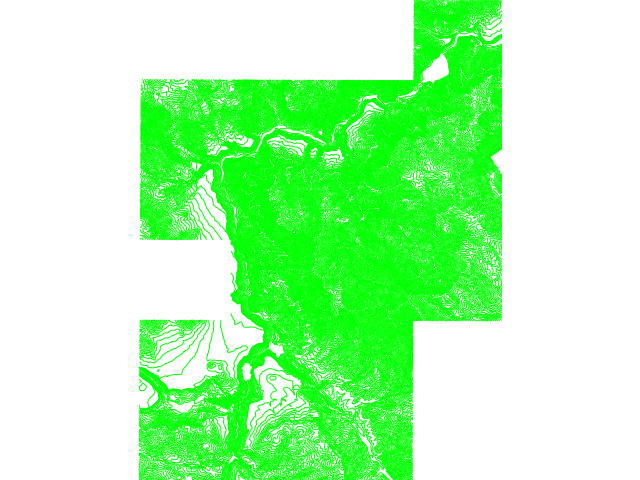

In [27]:
Image(filename="map.png")

In [28]:
read2_command("r.mask", vector='topog_contours', layer=11)
#read2_command("r.mask", vector='topog_contours', layer=11, where='z>500')
# https://grass.osgeo.org/grass75/manuals/r.mask.html

#read2_command("r.mask", flags='r')  #remove MASK

('',
 'WARNING: No area found in vector map <topog_contours@PERMANENT>. Creating a\n         convex hull for MASK.\nERROR: Convex hull calculation requires at least three points (0 found)\nERROR: Unable to create a convex hull for vector map\n       <topog_contours@PERMANENT>\nWARNING: No data base element files found\n')

## extract points from vector data from DXF

In [29]:
#points_out = read2_command("v.to.points", input='topog_contours', output='topog_contours_points') 
#print(points_out[1].decode())

#WARNING: 1565094 features without category in layer <1> skipped. Note that
#         features without category (usually boundaries) are not skipped
#         when 'layer=-1' is given.
# without categories --> seems x,y,z are all missing   !!

points_out = read2_command("v.to.points", input='topog_contours', layer=-1, output='topog_contours_points') 
print(points_out[1].decode())

# works (output)

         overwritten
   2%   5%   8%  11%  14%  17%  20%  23%  26%  29%  32%  35%  38%  41%  44%  47%  50%  53%  56%  59%  62%  65%  68%  71%  74%  77%  80%  83%  86%  89%  92%  95%  98% 100%
Building topology for vector map <topog_contours_points@PERMANENT>...
Registering primitives...
81479 primitives registered
81479 vertices registered
Building areas...
   0%   2%   4%   6%   8%  10%  12%  14%  16%  18%  20%  22%  24%  26%  28%  30%  32%  34%  36%  38%  40%  42%  44%  46%  48%  50%  52%  54%  56%  58%  60%  62%  64%  66%  68%  70%  72%  74%  76%  78%  80%  82%  84%  86%  88%  90%  92%

In [30]:
#print(read2_command("v.db.select", map='topog_contours_points', layer=-1)[0].decode()) 


# lots of output, apparently one line for each coordinate ??

In [31]:
print(read2_command("v.info", map='topog_contours_points')[0].decode()) 

 +----------------------------------------------------------------------------+
 | Name:            topog_contours_points                                     |
 | Mapset:          PERMANENT                                                 |
 | Location:        ShnoghHEP/                                                |
 | Database:        /home/kaelin_joseph/projects/ShnoghHEP/grassdata          |
 | Title:           topog_contours                                            |
 | Map scale:       1:2400                                                    |
 | Name of creator: kaelin_joseph                                             |
 | Organization:    GRASS Development Team                                    |
 | Source date:                                                               |
 | Timestamp (first layer): none                                              |
 |----------------------------------------------------------------------------|
 | Map format:      native              

In [32]:
read2_command("v.out.ascii", input='topog_contours_points', type='point', layer=-1, separator=',',
              output='data/out/topog_contours_points.csv')

# this works (but includes layers with bad data)
# try with only identified layers with correct contour data   !!

('', '')

In [33]:
# view and check points
!rm map.png                                                                                 #ToDo JK: pythonize
read2_command("d.vect", map='topog_contours_points')

('', 'd.vect complete.\n')

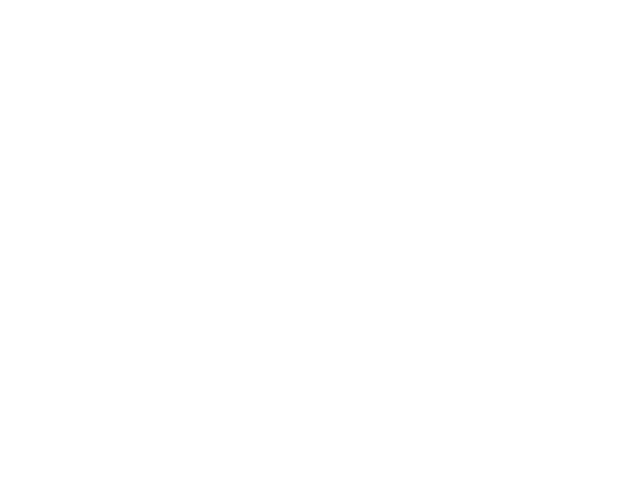

In [34]:
Image(filename="map.png")

# no image visible   ??
# image is displayed in qgisp

In [35]:
read2_command("v.to.rast", input='topog_contours_points', use='z', layer=-1, 
             output='topog_contours_points_rast')[0]


''

In [36]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
read2_command("d.rast", map='topog_contours_points_rast')[0]


''

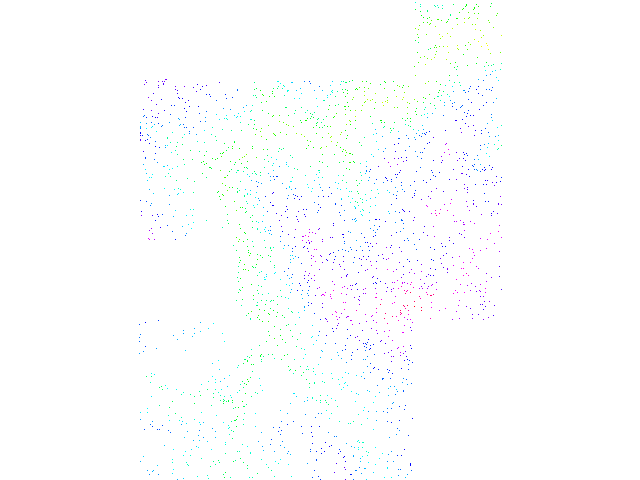

In [37]:
Image(filename="map.png")

## extract lines from vector data from DXF

In [38]:
read2_command("v.out.ascii", input='topog_contours', type='line', format='wkt', layer=-1,
              output='data/out/topog_contours_lines.csv')


('', '')

## convert vector data from DXF to raster data using v.to.rast

In [39]:
read2_command("v.to.rast", input='topog_contours', use='z', 
             output='topog_contours_rast')[1]


# [1] --> stderr        !!

'Reading features...\n   2%\x08\x08\x08\x08\x08   5%\x08\x08\x08\x08\x08   8%\x08\x08\x08\x08\x08  11%\x08\x08\x08\x08\x08  14%\x08\x08\x08\x08\x08  17%\x08\x08\x08\x08\x08  20%\x08\x08\x08\x08\x08  23%\x08\x08\x08\x08\x08  26%\x08\x08\x08\x08\x08  29%\x08\x08\x08\x08\x08  32%\x08\x08\x08\x08\x08  35%\x08\x08\x08\x08\x08  38%\x08\x08\x08\x08\x08  41%\x08\x08\x08\x08\x08  44%\x08\x08\x08\x08\x08  47%\x08\x08\x08\x08\x08  50%\x08\x08\x08\x08\x08  53%\x08\x08\x08\x08\x08  56%\x08\x08\x08\x08\x08  59%\x08\x08\x08\x08\x08  62%\x08\x08\x08\x08\x08  65%\x08\x08\x08\x08\x08  68%\x08\x08\x08\x08\x08  71%\x08\x08\x08\x08\x08  74%\x08\x08\x08\x08\x08  77%\x08\x08\x08\x08\x08  80%\x08\x08\x08\x08\x08  83%\x08\x08\x08\x08\x08  86%\x08\x08\x08\x08\x08  89%\x08\x08\x08\x08\x08  92%\x08\x08\x08\x08\x08  95%\x08\x08\x08\x08\x08  98%\x08\x08\x08\x08\x08 100%\x08\x08\x08\x08\x08\nWriting raster map...\n   0%\x08\x08\x08\x08\x08   3%\x08\x08\x08\x08\x08   6%\x08\x08\x08\x08\x08   9%\x08\x08\x08\x08\x08  1

In [40]:
#read2_command("v.build.all")[1]

# works for v.to.rast

In [41]:
read2_command("v.to.rast", input='topog_contours', use='z', 
             output='topog_contours_rast')[0]


''

In [42]:
print(read2_command("r.info", map='topog_contours_rast')[0].decode()) 


 +----------------------------------------------------------------------------+
 | Map:      topog_contours_rast            Date: Fri Aug 10 12:50:15 2018    |
 | Mapset:   PERMANENT                      Login of Creator: kaelin_joseph   |
 | Location: ShnoghHEP/                                                       |
 | DataBase: /home/kaelin_joseph/projects/ShnoghHEP/grassdata                 |
 | Title:    Categories ( topog_contours_rast )                               |
 | Timestamp: none                                                            |
 |----------------------------------------------------------------------------|
 |                                                                            |
 |   Type of Map:  raster               Number of Categories: 0               |
 |   Data Type:    DCELL                                                      |
 |   Rows:         2770                                                       |
 |   Columns:      2100                 

In [43]:
print(read2_command("r.univar", map='topog_contours_rast')[0].decode()) 


total null and non-null cells: 5817000
total null cells: 5073332

Of the non-null cells:
----------------------
n: 743668
minimum: 550
maximum: 2225
range: 1675
mean: 1304.25
mean of absolute values: 1304.25
standard deviation: 330.743
variance: 109391
variation coefficient: 25.359 %
sum: 969926320



In [44]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
read2_command("d.rast", map='topog_contours_rast')[0]


''

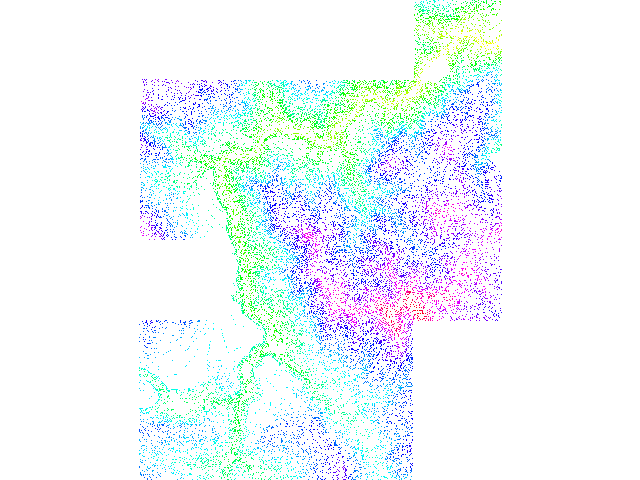

In [45]:
Image(filename="map.png")

In [46]:
#!d.mon stop=cairo
!d.mon start=cairo resolution=2 width=720 height=480

# sometimes works on image ??

ERROR: option <output>: <map.png> exists. To overwrite, use the --overwrite
       flag


In [47]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
read2_command("d.rast", map='topog_contours_rast')[0]


''

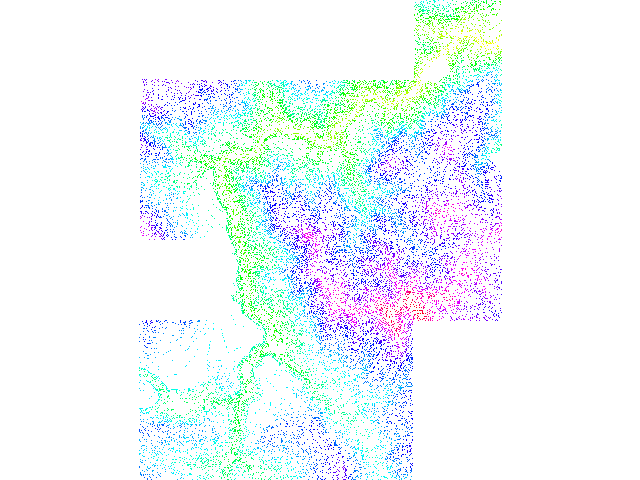

In [48]:
Image(filename="map.png")

## convert points to raster data using r.in.xyz

In [49]:
read2_command("r.in.xyz", input='data/out/topog_contours_points.csv', separator=',', zrange='400,2000',
             type='CELL', output='topog_contours_xyz_rast')[1]

# zrange from visual check of original topography


# use also fpr MASK (as first try)
##read2_command("r.in.xyz", input='data/out/topog_contours_points.csv', separator=',', zrange='400,2000',
##             type='CELL', output='MASK')[1]

'Reading input data...\n 100%\x08\x08\x08\x08\x08\nWriting to output raster map...\n   0%\x08\x08\x08\x08\x08   6%\x08\x08\x08\x08\x08  12%\x08\x08\x08\x08\x08  18%\x08\x08\x08\x08\x08  24%\x08\x08\x08\x08\x08  30%\x08\x08\x08\x08\x08  36%\x08\x08\x08\x08\x08  42%\x08\x08\x08\x08\x08  48%\x08\x08\x08\x08\x08  54%\x08\x08\x08\x08\x08  60%\x08\x08\x08\x08\x08  66%\x08\x08\x08\x08\x08  72%\x08\x08\x08\x08\x08  78%\x08\x08\x08\x08\x08  84%\x08\x08\x08\x08\x08  90%\x08\x08\x08\x08\x08  96%\x08\x08\x08\x08\x08 100%\x08\x08\x08\x08\x08\nr.in.xyz complete. 80021 points found in region.\n'

In [50]:
print(read2_command("r.info", map='topog_contours_xyz_rast')[0].decode()) 

 +----------------------------------------------------------------------------+
 | Map:      topog_contours_xyz_rast        Date: Fri Aug 10 12:50:18 2018    |
 | Mapset:   PERMANENT                      Login of Creator: kaelin_joseph   |
 | Location: ShnoghHEP/                                                       |
 | DataBase: /home/kaelin_joseph/projects/ShnoghHEP/grassdata                 |
 | Title:    Raw x,y,z data binned into a raster grid by cell mean ( topog_co |
 | Timestamp: none                                                            |
 |----------------------------------------------------------------------------|
 |                                                                            |
 |   Type of Map:  raster               Number of Categories: 0               |
 |   Data Type:    CELL                                                       |
 |   Rows:         2770                                                       |
 |   Columns:      2100                 

In [51]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
read2_command("d.rast", map='topog_contours_xyz_rast', verbose=True, bgcolor='red')[1]

"Using display driver <cairo>...\ncairo: collecting to file 'map.png'\ncairo: image size 640x480\n   0%\x08\x08\x08\x08\x08   3%\x08\x08\x08\x08\x08   6%\x08\x08\x08\x08\x08   9%\x08\x08\x08\x08\x08  12%\x08\x08\x08\x08\x08  15%\x08\x08\x08\x08\x08  18%\x08\x08\x08\x08\x08  21%\x08\x08\x08\x08\x08  24%\x08\x08\x08\x08\x08  27%\x08\x08\x08\x08\x08  30%\x08\x08\x08\x08\x08  33%\x08\x08\x08\x08\x08  36%\x08\x08\x08\x08\x08  39%\x08\x08\x08\x08\x08  42%\x08\x08\x08\x08\x08  45%\x08\x08\x08\x08\x08  48%\x08\x08\x08\x08\x08  51%\x08\x08\x08\x08\x08  54%\x08\x08\x08\x08\x08  57%\x08\x08\x08\x08\x08  60%\x08\x08\x08\x08\x08  63%\x08\x08\x08\x08\x08  66%\x08\x08\x08\x08\x08  69%\x08\x08\x08\x08\x08  72%\x08\x08\x08\x08\x08  75%\x08\x08\x08\x08\x08  78%\x08\x08\x08\x08\x08  81%\x08\x08\x08\x08\x08  84%\x08\x08\x08\x08\x08  87%\x08\x08\x08\x08\x08  90%\x08\x08\x08\x08\x08  93%\x08\x08\x08\x08\x08  96%\x08\x08\x08\x08\x08  99%\x08\x08\x08\x08\x08 100%\x08\x08\x08\x08\x08\n"

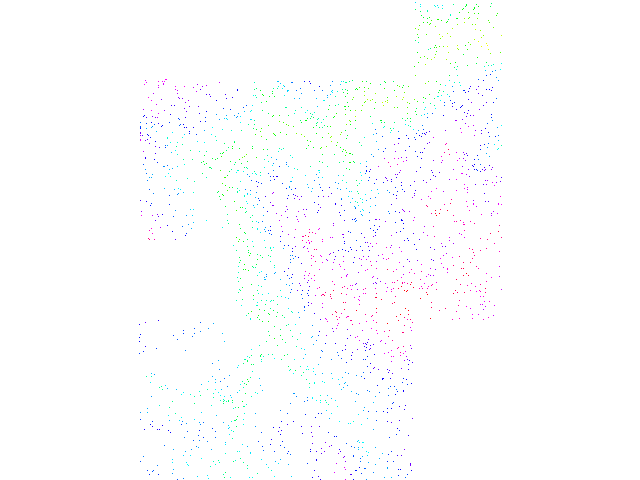

In [52]:
Image(filename="map.png")

## develop raster from contours into filled raster using r.surf.contour

In [53]:
# read2_command("r.surf.contour", input='topog_contours_rast', 
#               output='topog_rast')[0]

# # read2_command("r.surf.idw", input='topog_contours_rast', 
# #               output='topog_rast_idw')[1]    
# # ERROR: This module currently only works for integer (CELL) maps

# # very slow
# # with 'topog_contours_points_rast' as MASK fast

# # output covers entire region, no clipping

In [54]:
# # view and check topography
# !rm map.png                                                                                 #ToDo JK: pythonize
# read2_command("d.rast", map='topog_rast', verbose=True, bgcolor='white', flags='n', values='500-2000')[0]

In [55]:
# Image(filename="map.png")


# # choices for handling Nan?

## experiment with better ways to develop raster from contours into filled raster

In [56]:
# r.surf.nnbathy

In [57]:
!r.surf.nnbathy --help
#https://grass.osgeo.org/grass74/manuals/addons/r.surf.nnbathy.html
#https://gis.stackexchange.com/questions/118243/create-a-dem-from-point-data?noredirect=1&lq=1

/bin/sh: 1: r.surf.nnbathy: not found


In [58]:
# r.neighbors using output from v.to.rast

In [59]:
read2_command("r.neighbors", input='topog_contours_rast', method='average', size=3,
              output='topog_rast_neighbors')[0]

''

In [60]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
read2_command("d.rast", map='topog_rast_neighbors', verbose=True, bgcolor='white', flags='n', 
              values='0-2000')[0]

''

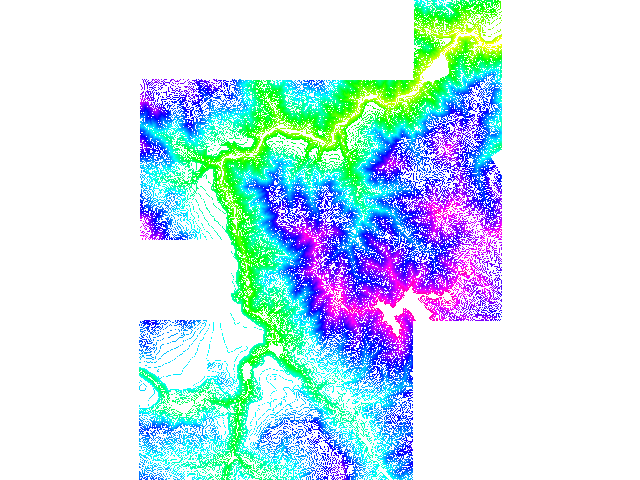

In [61]:
Image(filename="map.png")

In [62]:
read2_command("r.neighbors", input='topog_contours_rast', method='average', size=6,
              output='topog_rast_neighbors')[0]

''

In [63]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
read2_command("d.rast", map='topog_rast_neighbors', verbose=True, bgcolor='white', flags='n', 
              values='0-2000')[0]

''

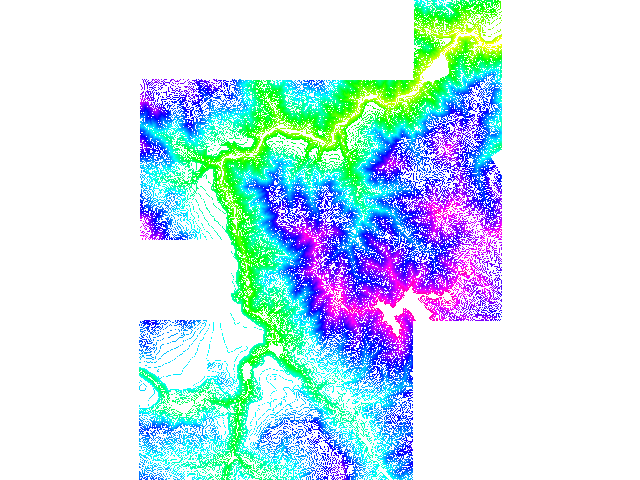

In [64]:
Image(filename="map.png")

In [65]:
# r.neighbors using output from r.in.xyz

In [66]:
read2_command("r.neighbors", input='topog_contours_xyz_rast', method='average', size=4,
              output='topog_rast_neighbors')[0]


''

In [67]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
read2_command("d.rast", map='topog_rast_neighbors', verbose=True, bgcolor='white', flags='n', 
              values='0-2000')[0]

''

In [68]:
read2_command("d.legend", raster='topog_rast_neighbors')[0]

''

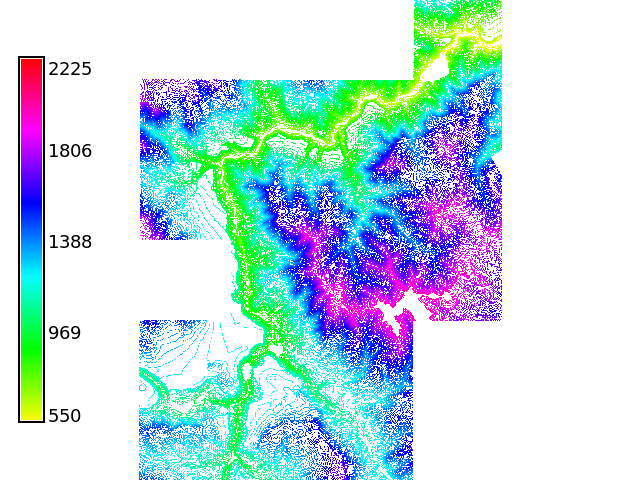

In [69]:
Image(filename="map.png")

In [70]:
# r.resamp.rst using output from r.in.xyz

In [71]:
read2_command("r.resamp.rst", input='topog_contours_xyz_rast', ew_res=10, ns_res=10,
              elevation='topog_xyz_rast_resamp')[0]


''

In [72]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
read2_command("d.rast", map='topog_xyz_rast_resamp', verbose=True, bgcolor='white', flags='n', 
              values='0-2000')[0]
# fast

''

In [73]:
read2_command("d.legend", raster='topog_xyz_rast_resamp')[0]

''

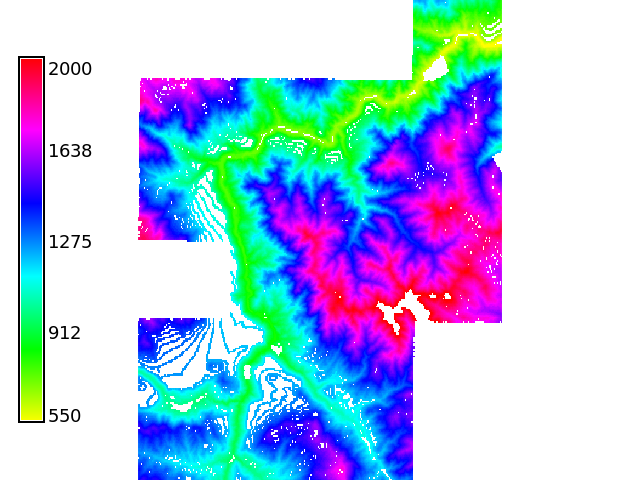

In [74]:
Image(filename="map.png")

In [75]:
# r.resamp.rst using output from v.to.rast

In [76]:
read2_command("r.resamp.rst", input='topog_contours_rast', ew_res=10, ns_res=10,
              elevation='topog_rast_resamp')[0]

# result seems quite good, high definition, probably best of my attempts
# only a few relevant 'holes' where points data sparse
# what is bluish line following above valley ??
# raster is clipped along available topography

''

In [77]:
print(read2_command("r.report", map='topog_rast_resamp', units='h,p')[0].decode()) 

+-----------------------------------------------------------------------------+
|                         RASTER MAP CATEGORY REPORT                          |
|LOCATION: ShnoghHEP/                                 Fri Aug 10 12:50:56 2018|
|-----------------------------------------------------------------------------|
|          north: 4559200    east: 8484100                                    |
|REGION    south: 4531500    west: 8463100                                    |
|          res:        10    res:       10                                    |
|-----------------------------------------------------------------------------|
|MASK: none                                                                   |
|-----------------------------------------------------------------------------|
|MAP: (untitled) (topog_rast_resamp in PERMANENT)                             |
|-----------------------------------------------------------------------------|
|                   Category Information

In [78]:
#!d.mon stop=cairo
#!d.mon start=cairo resolution=2 width=720 height=480 --overwrite
!d.mon start=cairo resolution=2 width=1080 height=720 --overwrite

# only sometimes works on image, why  ?? 

WARNING: File 'map.png' already exists and will be overwritten
Output file: /home/kaelin_joseph/projects/ShnoghHEP/map.png


In [79]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
# read2_command("d.rast", map='topog_rast_resamp', verbose=True, bgcolor='white', flags='n', 
#               values='0-2000')[0]
read2_command("d.rast", map='topog_rast_resamp', verbose=True, bgcolor='white', flags='n')[0]

''

In [80]:
read2_command("d.legend", raster='topog_rast_resamp', fontsize='22')[1]

'WARNING: MONITOR variable defined, GRASS_RENDER_IMMEDIATE ignored\n'

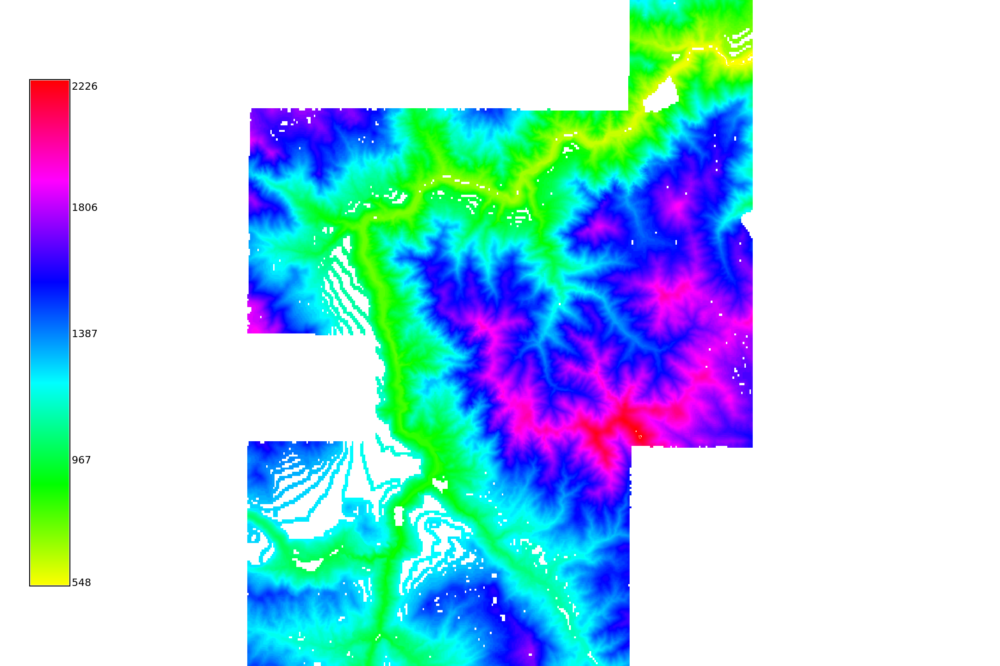

In [81]:
Image(filename="map.png")

## experiment with relief maps

In [82]:
# relief map using r.relief using output from r.in.xyz
# read2_command("r.relief", input='topog_contours_points_rast', 
#               output='topog_rast_relief')[0]
# no output displayed ??

# relief map using r.relief r.resamp.rst, from v.to.rast
# read2_command("r.relief", input='topog_contours_rast', 
#               output='topog_rast_relief')[1]
# no output displayed ??

read2_command("r.relief", input='topog_rast_resamp', 
              output='topog_rast_relief')[0]
# colored relief map?  --> see below

# can r.shaded.relief  do a colred relief map in one go  ??
# https://grass.osgeo.org/grass64/manuals/r.shaded.relief.html
# https://grass.osgeo.org/grass72/manuals/r.relief.html
# https://grass.osgeo.org/grass72/manuals/r.shade.html

''

In [83]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
read2_command("d.rast", map='topog_rast_relief', verbose=True, bgcolor='white')[0]

''

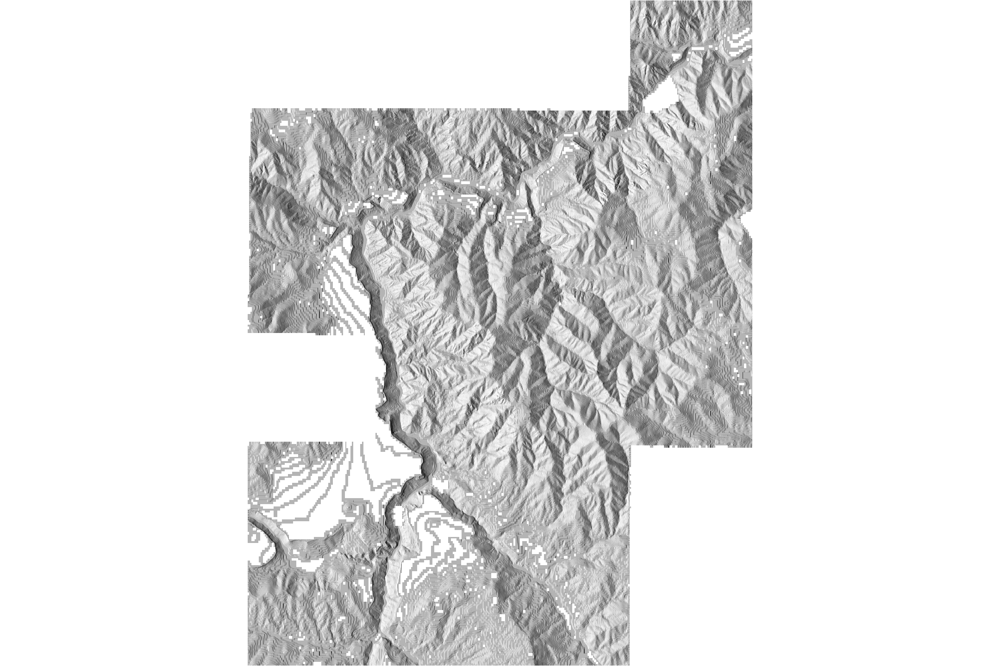

In [84]:
Image(filename="map.png")

In [85]:
read2_command("r.shade", shade='topog_rast_relief', 
              color='topog_rast_resamp', output='topog_rast_relief_color')[0]


''

In [177]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
read2_command("d.rast", map='topog_rast_relief_color', verbose=True, bgcolor='white')[0]

''

In [178]:
read2_command("d.legend", raster='topog_rast_resamp', fontsize='22')[1]

read2_command("d.grid", size=10000)[1]
# https://grass.osgeo.org/grass75/manuals/d.grid.html

'WARNING: MONITOR variable defined, GRASS_RENDER_IMMEDIATE ignored\n'

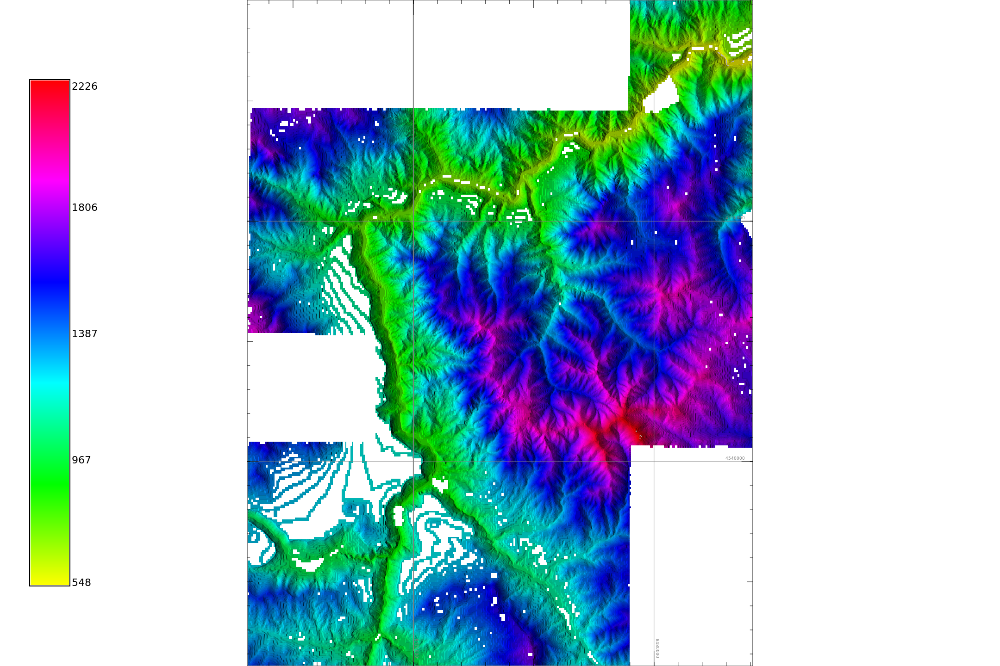

In [179]:
Image(filename="map.png")

## experiment with watershed modules

In [298]:
#!r.watershed elevation=topog_rast_resamp basin=topog_rast_resamp_basin threshold=30000
!r.watershed elevation=topog_rast_resamp basin=topog_rast_resamp_basin threshold=100000


SECTION 1a (of 5): Initiating Memory.
SECTION 1b (of 5): Determining Offmap Flow.
   0   4   8  12  16  20  24  28  32  36  40  44  48  52  56  60  64  68  72  76  80  84  88  92  96 100
SECTION 2: A* Search.
   0   2   4   6   8  10  12  14  16  18  20  22  24  26  28  30  32  34  36  38  40  42  44  46  48  50  52  54  56  58  60  62  64  66  68  70  72  74  76  78  80  82  84  86  88  90  92  94  96  98 100
SECTION 3a: Accumulating Surface Flow with MFD.
   1   3   5   7   9  11  13  15  17  19  21  23  25  27  29  31  33  35  37  39  41  43  45  47  49  51  53  55  57  59  61  63  65  67  69  71  73  75  77  79  81  83  85  87  89  91  93  95  97  99 100
SECTION 3b: Adjusting drainage directions.
   1   3   5   7   9  11  13  15  17  19  21  23  25  27  29  31  33  35  37  39  41  43  45  47  49  51  53  55  57  59  61  63  65  67  69  71  73  75  77  79  81  83  85  87  89  91  93  95  97  99 100
SECTION 4: Watershed determination.
   0   2   4   6   8  10  12  14  16  18  20  22 

In [299]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
read2_command("d.rast", map='topog_rast_resamp_basin', verbose=True, bgcolor='white')[0]

''

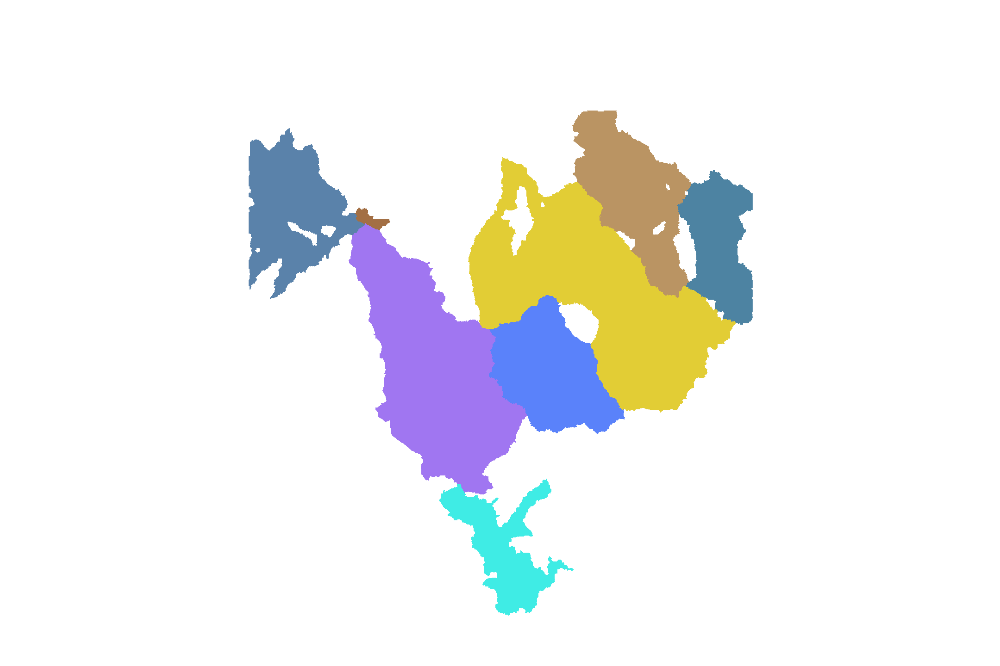

In [300]:
Image(filename="map.png")

In [301]:
!r.watershed elevation=topog_rast_resamp stream=topog_rast_resamp_stream threshold=1000


SECTION 1a (of 5): Initiating Memory.
SECTION 1b (of 5): Determining Offmap Flow.
   0   4   8  12  16  20  24  28  32  36  40  44  48  52  56  60  64  68  72  76  80  84  88  92  96 100
SECTION 2: A* Search.
   0   2   4   6   8  10  12  14  16  18  20  22  24  26  28  30  32  34  36  38  40  42  44  46  48  50  52  54  56  58  60  62  64  66  68  70  72  74  76  78  80  82  84  86  88  90  92  94  96  98 100
SECTION 3a: Accumulating Surface Flow with MFD.
   1   3   5   7   9  11  13  15  17  19  21  23  25  27  29  31  33  35  37  39  41  43  45  47  49  51  53  55  57  59  61  63  65  67  69  71  73  75  77  79  81  83  85  87  89  91  93  95  97  99 100
SECTION 3b: Adjusting drainage directions.
   1   3   5   7   9  11  13  15  17  19  21  23  25  27  29  31  33  35  37  39  41  43  45  47  49  51  53  55  57  59  61  63  65  67  69  71  73  75  77  79  81  83  85  87  89  91  93  95  97  99 100
SECTION 4: Watershed determination.
   0   2   4   6   8  10  12  14  16  18  20  22 

In [302]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
read2_command("d.rast", map='topog_rast_resamp_stream', verbose=True, bgcolor='white')[0]

''

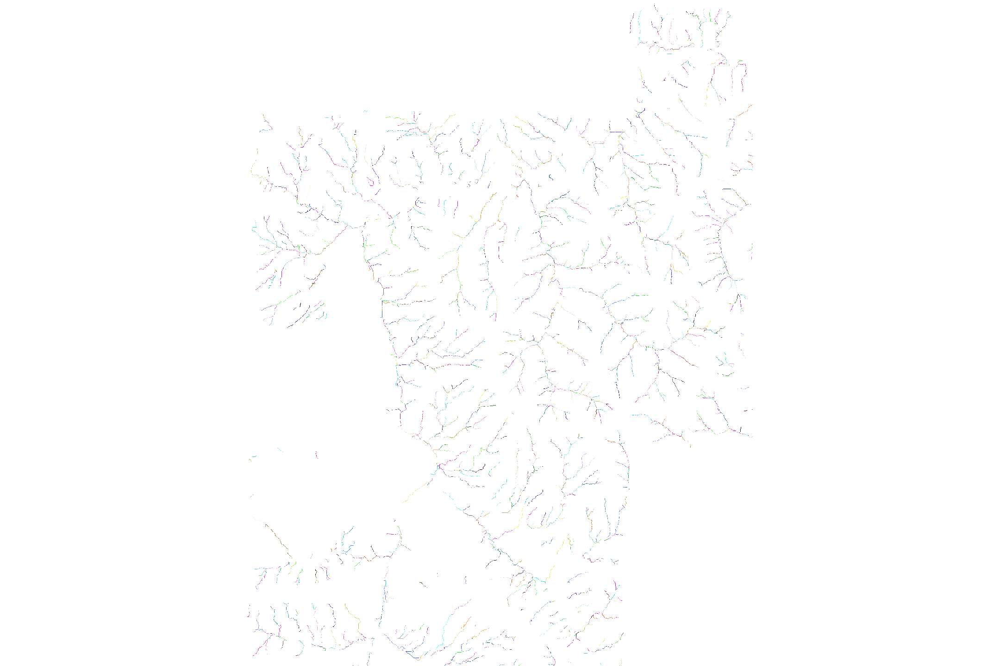

In [303]:
Image(filename="map.png")

In [304]:
!r.watershed elevation=topog_rast_resamp accumulation=topog_rast_resamp_stream threshold=1000


SECTION 1a (of 5): Initiating Memory.
SECTION 1b (of 5): Determining Offmap Flow.
   0   4   8  12  16  20  24  28  32  36  40  44  48  52  56  60  64  68  72  76  80  84  88  92  96 100
SECTION 2: A* Search.
   0   2   4   6   8  10  12  14  16  18  20  22  24  26  28  30  32  34  36  38  40  42  44  46  48  50  52  54  56  58  60  62  64  66  68  70  72  74  76  78  80  82  84  86  88  90  92  94  96  98 100
SECTION 3a: Accumulating Surface Flow with MFD.
   1   3   5   7   9  11  13  15  17  19  21  23  25  27  29  31  33  35  37  39  41  43  45  47  49  51  53  55  57  59  61  63  65  67  69  71  73  75  77  79  81  83  85  87  89  91  93  95  97  99 100
SECTION 3b: Adjusting drainage directions.
   1   3   5   7   9  11  13  15  17  19  21  23  25  27  29  31  33  35  37  39  41  43  45  47  49  51  53  55  57  59  61  63  65  67  69  71  73  75  77  79  81  83  85  87  89  91  93  95  97  99 100
SECTION 4: Watershed determination.
   0   2   4   6   8  10  12  14  16  18  20  22 

In [305]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
read2_command("d.rast", map='topog_rast_resamp_stream', verbose=True, bgcolor='white')[0]

''

In [306]:
read2_command("d.legend", raster='topog_rast_resamp_stream', fontsize='22')[1]

'WARNING: MONITOR variable defined, GRASS_RENDER_IMMEDIATE ignored\n'

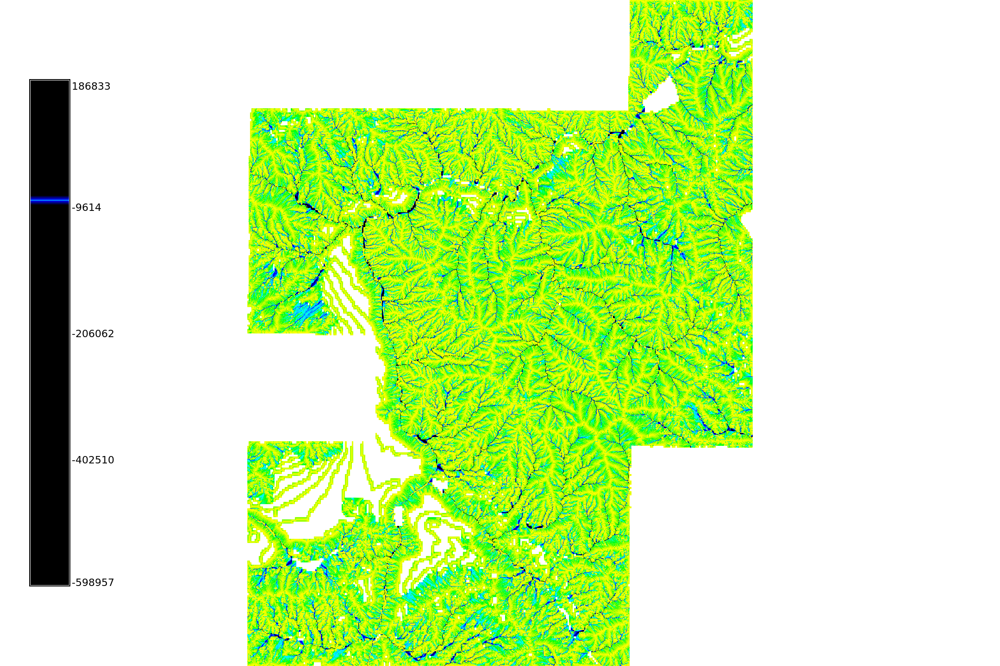

In [307]:
Image(filename="map.png")


In [ ]:
# improve display of watershed and streamcourses
# http://gis.jkaelin.com:8080/notebooks/testing/geospatial-modeling-course-jupyter/notebooks/hydrology_python.ipynb

In [338]:
# filter accumulation for values (number of cells that drain through each cell) > 100 and set these =1
gs.mapcalc("topog_rast_resamp_stream_calc = if(abs(topog_rast_resamp_stream) > 1000, 1, null())")

In [339]:
# vectorize watershed raster data
gs.run_command('r.to.vect', input="topog_rast_resamp_basin", output="topog_rast_resamp_basin", 
               type="area", flags='s')

0

In [340]:
# # view and check topography
# !rm map.png                                                                                 #ToDo JK: pythonize
# read2_command("d.rast", map='topog_rast_resamp_stream_calc', verbose=True, bgcolor='white')[0]

''

In [354]:
# Image(filename="map.png")
# # displays ok

In [342]:
# clean raster data of streamcourse in preparation for converting to vector data
gs.run_command('r.thin', input="topog_rast_resamp_stream_calc", output="topog_rast_resamp_stream_calc_thin")

0

In [343]:
# convert raster data of streamcourses to vector data
gs.run_command('r.to.vect', input="topog_rast_resamp_stream_calc_thin", 
               out="topog_rast_resamp_stream_calc_vect", type="line", flags='s')

0

In [356]:
# read stream data imported from topography dxf
read2_command("v.in.dxf", input=TopogContours, layers='river-maj',  
             output='streams')[0]

''

In [366]:
# view and check hydrology
!rm map.png                                                                                 #ToDo JK: pythonize

# display shaded relief map with watershed basins
read2_command('d.his', hue="topog_rast_resamp_basin", intensity="topog_rast_relief", brighten="40")[0]
# display watershed basin boundaires
gs.run_command('d.vect', map="topog_rast_resamp_basin", type="boundary",  width=2)
# display streams calculated from accumulation
read2_command("d.vect", map='topog_rast_resamp_stream_calc_vect', verbose=True, bgcolor='white', 
              color='indigo', width=3)[0]
# display stream imported from dxf
gs.run_command('d.vect', map="streams", type="line", color='blue', width=3)

read2_command("d.grid", size=10000, fontsize=20)[1]
# colors
# https://sites.google.com/site/hamishbowman/grass_color_maps

'WARNING: MONITOR variable defined, GRASS_RENDER_IMMEDIATE ignored\n'

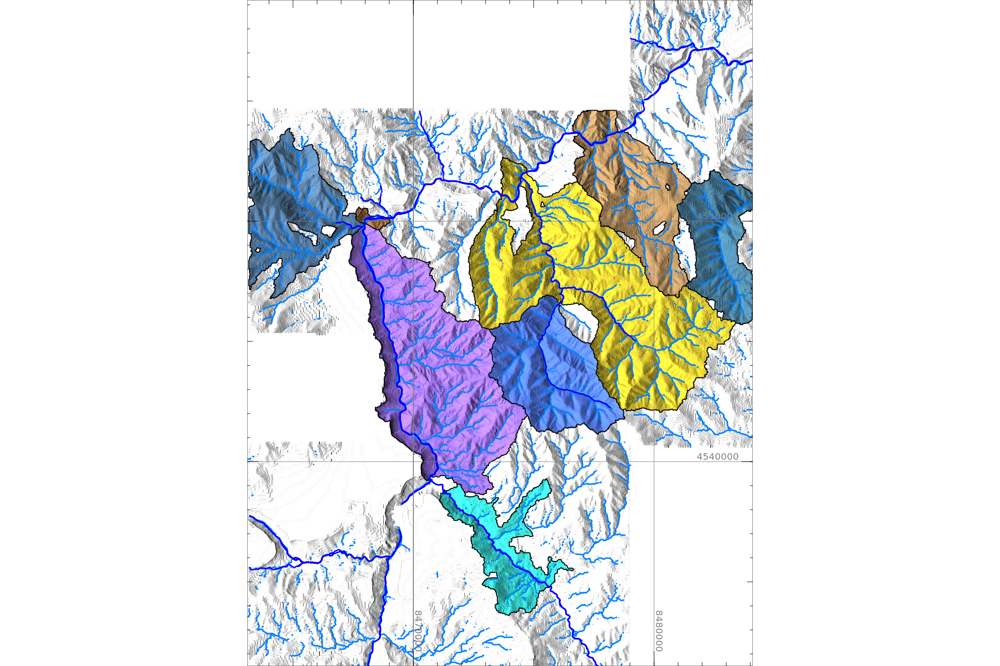

In [367]:
Image(filename="map.png")

## experiment with importing images into grass

In [ ]:
# import project layout into grass




## more experimentation with better ways to develop raster from contours into filled raster

In [88]:
# grass documentation recomments r.surf and v.surf methods for interpreting elevations from countour lines

In [89]:
# experiment with r.surf.idw

In [90]:
##read2_command("g.remove", name='MASK', type='raster', flags='f')[1] 
# preferable to use r.mask to manage (add and remove) MASK

In [91]:
# !r.mapcalc topog_contours_rast_CELL="int(topog_contours_rast)"  #integer floor
# !r.mapcalc topog_contours_rast_CELL="round(topog_contours_rast)"  #nearest integer
# read2_command("r.surf.idw", input='topog_contours_rast_CELL', 
#              output='topog_rast_idw')[1]   
# ERROR: This module currently only works for integer (CELL) maps
# works with r.mapcalc, no clipping

read2_command("r.surf.idw", input='topog_contours_xyz_rast', 
              output='topog_rast_idw')[0]   
# fast and good results
# fills entire region, no clipping

# use topog_contours_points_rast as MASK (see above) -> poor result, apparently all null areas are masked  !!
# delete layer MASK  !!
# using vector layer as MASK works better, but still not an adequate solution

''

In [92]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
read2_command("d.rast", map='topog_rast_idw', verbose=True, bgcolor='white')[0]

''

In [93]:
read2_command("d.legend", raster='topog_rast_idw')[0]

''

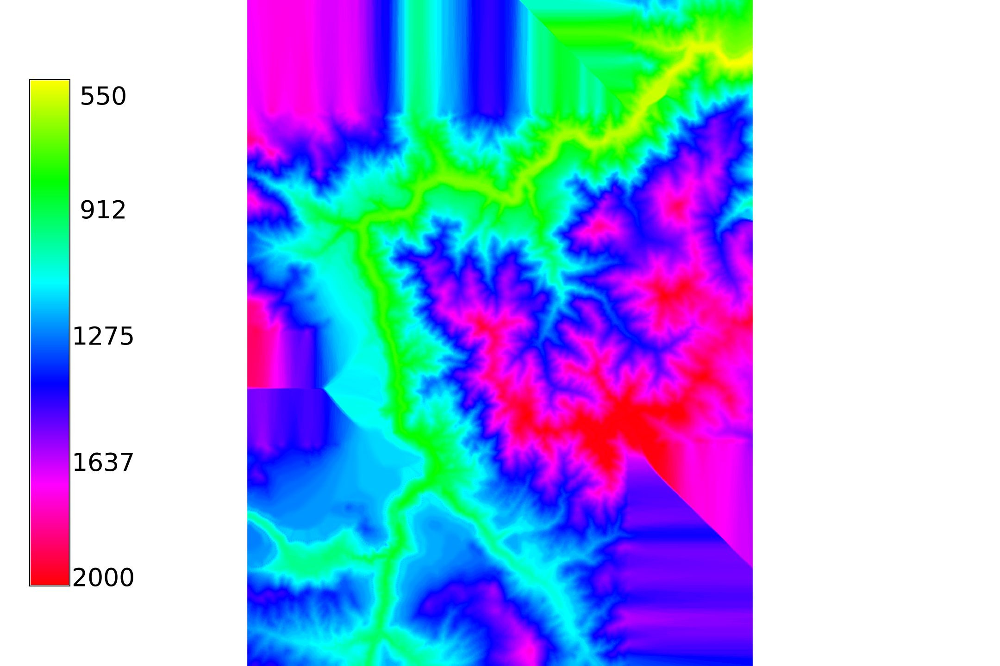

In [94]:
Image(filename="map.png")


In [95]:
# experiment with v.surf.idw

In [96]:
# read2_command("v.surf.idw", input='topog_contours', layer='maj @ 20,maj',
#               output='topog_rast_idw')[1]  
read2_command("v.surf.idw", input='topog_contours', layer='maj',
              output='topog_rast_idw')[1]  

# all evelevation in raster output = 0  ???
# after removing 'maj @ 20'  --> ok
# no clipping


# read2_command("v.surf.rst", input='topog_contours', layer='maj @ 20,maj',
#               elevation='topog_rast_rst')[1]   

# print(read2_command("v.surf.rst", input='topog_contours', layer='maj @ 20,maj',
#               elevation='topog_rast_rst')[1].decode())

# result of v.surf.rst
# slow (> 1h

# result of v.surf.rst not good
#   Range of data:    min = -1010.684  max = 3818.498 
# many warnings
#   Some points outside of region (ignored)
#   Taking too long to find points for interpolation - 
#      please change the region to area where your points are. Continuing calculations...
#   Overshoot - increase in tension suggested.

# raster is clipped along available topography

'Input vector map <topog_contours@PERMANENT> is 3D - using z-coordinates to\ninterpolate\n0 points loaded\nERROR: No points found\n'

In [98]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
read2_command("d.rast", map='topog_rast_idw', verbose=True, bgcolor='white', flags='n', 
              values='0-2000')[0]
#read2_command("d.rast", map='topog_rast_idw', verbose=True, bgcolor='white')[0]

''

In [99]:
read2_command("d.legend", raster='topog_rast_idw')[0]

''

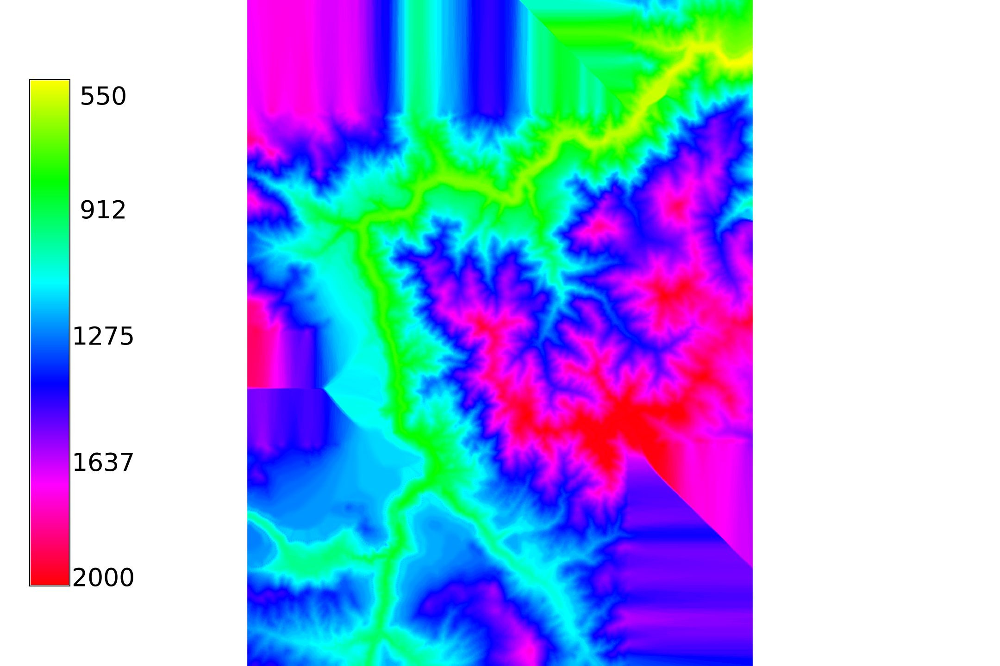

In [100]:
Image(filename="map.png")


In [101]:
# read2_command("v.surf.idw", input='topog_contours_points', layer='maj @ 20,maj',
#               output='topog_contours_points_idw')[0] 

# # slow (30 min)
# # no clipping

In [102]:
# # view and check topography
# !rm map.png                                                                                 #ToDo JK: pythonize
# read2_command("d.rast", map='topog_contours_points_idw', verbose=True, bgcolor='white', flags='n', 
#               values='0-2000')[0]

In [103]:
# read2_command("d.legend", raster='topog_contours_points_idw')[0]

In [104]:
# Image(filename="map.png")


In [105]:
!r.mapcalc "topog_contours_rast_=(topog_rast_resamp)-(topog_xyz_rast_resamp)"


   0   3   6   9  12  15  18  21  24  27  30  33  36  39  42  45  48  51  54  57  60  63  66  69  72  75  78  81  84  87  90  93  96  99 100


In [155]:
print(read2_command("r.univar", map='topog_contours_rast_')[0].decode()) 


total null and non-null cells: 5817000
total null cells: 1802575

Of the non-null cells:
----------------------
n: 4014425
minimum: -80.5995
maximum: 99.9709
range: 180.57
mean: 0.144233
mean of absolute values: 5.02568
standard deviation: 7.52723
variance: 56.6591
variation coefficient: 5218.79 %
sum: 579013.727172852



In [152]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
#read2_command("d.rast", map='topog_contours_rast_', verbose=True, bgcolor='white', flags='n',
#             )[0]
read2_command("d.rast", map='topog_contours_rast_', verbose=True, bgcolor='white', flags='n',
              values='(-10)-(10)')[0]

''

In [153]:
read2_command("d.legend", raster='topog_contours_rast_')[1]
#read2_command("d.legend", raster='topog_contours_rast_', range='-10,10')[1]

'WARNING: MONITOR variable defined, GRASS_RENDER_IMMEDIATE ignored\n'

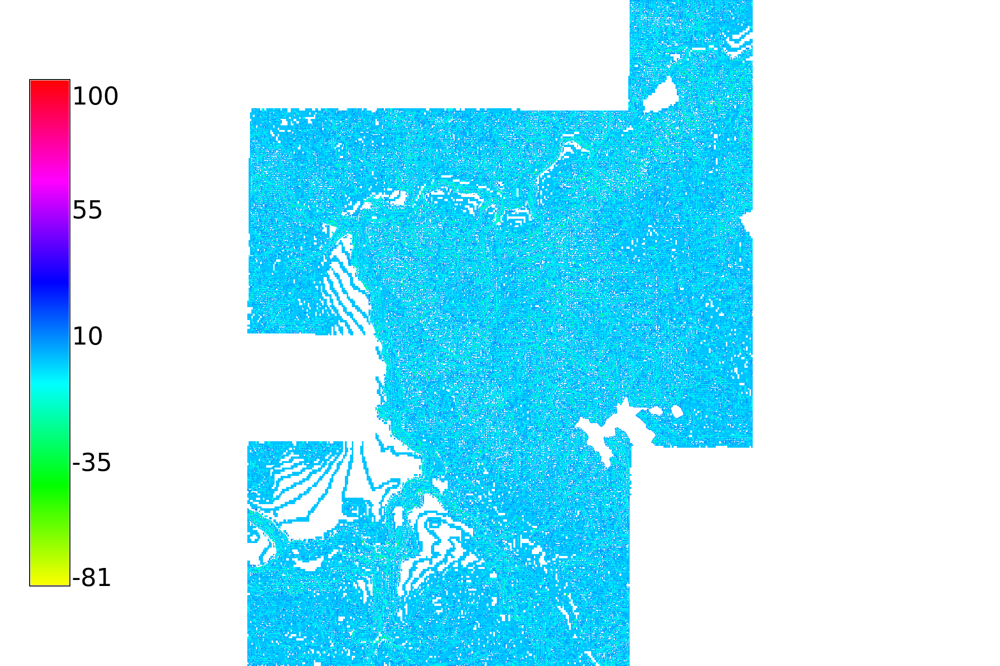

In [154]:
Image(filename="map.png")

In [166]:
!r.mapcalc "topog_contours_rast_filtered_=if(topog_rast_resamp>2340,null(),topog_rast_resamp)"
# attempt at filtering out the extraneous line with z=2350
# in the end, I cleaned manually with Draftsight

#!r.mapcalc "topog_contours_rast_filtered_=(topog_rast_resamp)-(topog_xyz_rast_resamp)"
#newmap = if(map<5, null(), 5)


   0   3   6   9  12  15  18  21  24  27  30  33  36  39  42  45  48  51  54  57  60  63  66  69  72  75  78  81  84  87  90  93  96  99 100


In [167]:
#!r.mapcalc "topog_contours_rast_=(topog_contours_rast_filtered_)-(topog_xyz_rast_resamp)"


In [168]:
# view and check topography
!rm map.png                                                                                 #ToDo JK: pythonize
read2_command("d.rast", map='topog_contours_rast_filtered_', verbose=True, bgcolor='white', flags='n',
             )[0]
# read2_command("d.rast", map='topog_contours_rast_', verbose=True, bgcolor='white', flags='n',
#              values='0 - 100')[0]

''

In [169]:
read2_command("d.legend", raster='topog_contours_rast_filtered_')[1]
#read2_command("d.legend", raster='topog_contours_rast_', range='0,100')[1]

'WARNING: MONITOR variable defined, GRASS_RENDER_IMMEDIATE ignored\n'

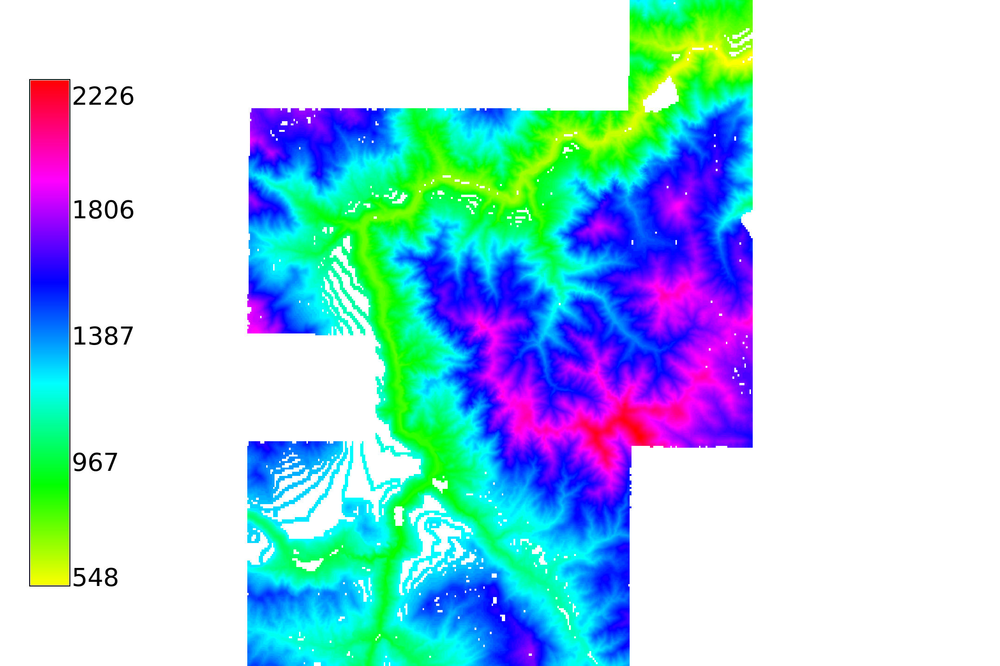

In [170]:
Image(filename="map.png")